## Masked Autoencoders: Visualization Demo

This is a visualization demo using our pre-trained MAE models. No GPU is needed.

### Prepare
Check environment. Install packages if in Colab.


In [1]:
import sys
import os
import requests

import torch
import numpy as np

import matplotlib.pyplot as plt
from PIL import Image

# check whether run in Colab
if 'google.colab' in sys.modules:
    print('Running in Colab.')
    !pip3 install timm==0.4.5  # 0.3.2 does not work in Colab
    !git clone https://github.com/facebookresearch/mae.git
    sys.path.append('./mae')
else:
    !pip install timm==0.4.12
    sys.path.append('..')
    
import models_mae_chans3

sys.path.append('../../dark3d/src/models/training_framework/dataloaders/')
import dataloaders

Defaulting to user installation because normal site-packages is not writeable


`fused_weight_gradient_mlp_cuda` module not found. gradient accumulation fusion with weight gradient computation disabled.
/opt/conda/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==60.2.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(


### Define utils

In [22]:
# define the utils

imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def show_image(image, title=''):
    # image is [H, W, 3]
    assert image.shape[2] == 3
    plt.imshow(torch.clip((image * imagenet_std + imagenet_mean) * 255, 0, 255).int())
    plt.title(title, fontsize=16)
    plt.axis('off')
    return

def prepare_model(chkpt_dir, arch='mae_vit_large_patch16'):
    # build model
    model = getattr(models_mae_chans3, arch)()
    # load model
    checkpoint = torch.load(chkpt_dir, map_location='cpu')
    msg = model.load_state_dict(checkpoint['model'], strict=False)
    print(msg)
    return model

def run_one_image(img, model, mask_ratio=0.75):
    x = torch.tensor(img)

    # make it a batch-like
    x = x.unsqueeze(dim=0)
    x = torch.einsum('nhwc->nchw', x)

    # run MAE
    loss, y, mask = model(x.float(), mask_ratio=mask_ratio)
    y = model.unpatchify(y)
    y = torch.einsum('nchw->nhwc', y).detach().cpu()

    # visualize the mask
    mask = mask.detach()
    mask = mask.unsqueeze(-1).repeat(1, 1, model.patch_embed.patch_size[0]**2 *3)  # (N, H*W, p*p*3)
    mask = model.unpatchify(mask)  # 1 is removing, 0 is keeping
    mask = torch.einsum('nchw->nhwc', mask).detach().cpu()
    
    x = torch.einsum('nchw->nhwc', x)

    # masked image
    im_masked = x * (1 - mask)

    # MAE reconstruction pasted with visible patches
    im_paste = x * (1 - mask) + y * mask

    # make the plt figure larger
    plt.rcParams['figure.figsize'] = [24, 24]

    plt.subplot(1, 4, 1)
    show_image(x[0], "original")

    plt.subplot(1, 4, 2)
    show_image(im_masked[0], "masked")

    plt.subplot(1, 4, 3)
    show_image(y[0], "reconstruction")

    plt.subplot(1, 4, 4)
    show_image(im_paste[0], "reconstruction + visible")

    plt.show()

### Load an image

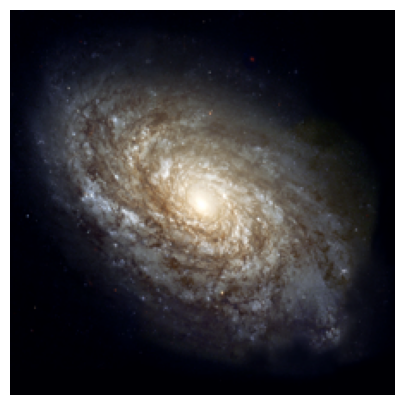

In [3]:
# load an image
img_url = 'https://upload.wikimedia.org/wikipedia/commons/c/c3/NGC_4414_%28NASA-med%29.jpg'
img_gal = Image.open(requests.get(img_url, stream=True).raw)
img_gal = img_gal.resize((224, 224))
img_gal = np.array(img_gal) / 255.

assert img_gal.shape == (224, 224, 3)

# normalize by ImageNet mean and std
img_gal = img_gal - imagenet_mean
img_gal = img_gal / imagenet_std

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_gal))

In [55]:
kwargs = {
        'n_cutouts': 57000,
        'bands': ['u', 'g', 'r', 'i', 'z'],
        'cutout_size': 200,
        'cutouts_per_file': 10000,
        'batch_size': 1,
        'h5_directory': '/arc/projects/unions/ssl/data/processed/unions-cutouts/ugriz_lsb/10k_per_h5'
    }
    
s = dataloaders.SpencerHDF5ReaderDataset(**kwargs)
print(s[0].shape)

idx=[9072, 9079, 1006, 10122, 40446]
print(s.get_3_chans(idx[0]).shape)

(1, 5, 200, 200)
(200, 200, 3)


(200, 200, 3)


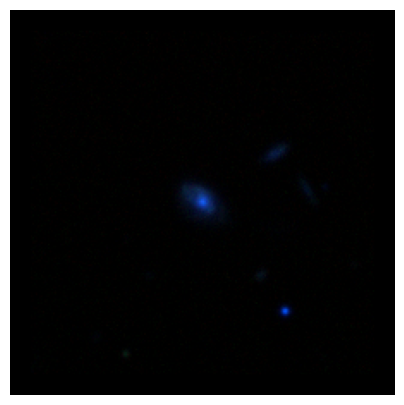

In [56]:
# load an image (make this into a function)
img = s.get_3_chans(idx[0]).copy()
print(img.shape)
new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = np.pad(img[:, :, i], (12, 12), 'constant', constant_values=0)
img= np.array(new_img) / 255. # need to norm by something else, take max and min

assert img.shape == (224, 224, 3)

# normalize by ImageNet mean and std (redo for your case)
img = img - imagenet_mean
img_0 = img / imagenet_std

img_list = []
img_list.append(img_0)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_0))

(200, 200, 3)


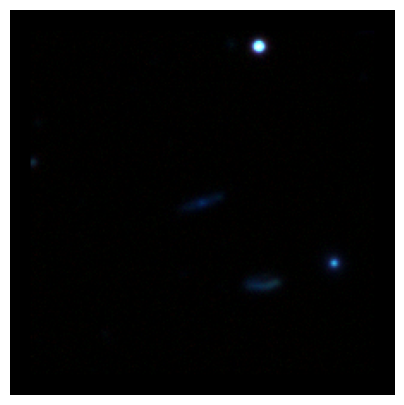

In [57]:
# load an image (make this into a function)
img = s.get_3_chans(idx[1]).copy()
print(img.shape)
new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = np.pad(img[:, :, i], (12, 12), 'constant', constant_values=0)
img= np.array(new_img) / 255. # need to norm by something else, take max and min

assert img.shape == (224, 224, 3)

# normalize by ImageNet mean and std (redo for your case)
img = img - imagenet_mean
img_1 = img / imagenet_std
img_list.append(img_1)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_1))

(200, 200, 3)


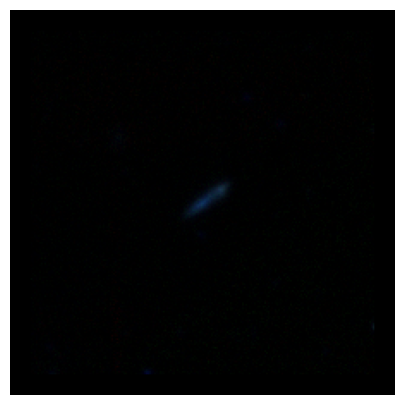

In [58]:
img = s.get_3_chans(idx[2]).copy()
print(img.shape)
new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = np.pad(img[:, :, i], (12, 12), 'constant', constant_values=0)
img = np.array(new_img) / 255. 
img = img - imagenet_mean
img_2 = img / imagenet_std
img_list.append(img_2)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_2))

(200, 200, 3)


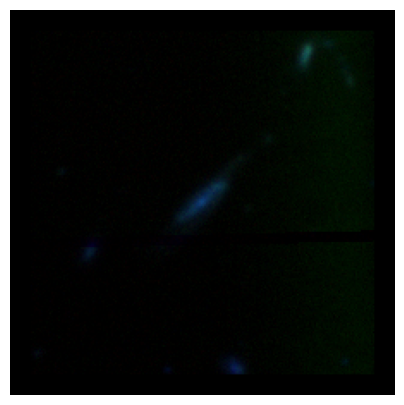

In [59]:
img = s.get_3_chans(idx[3]).copy()
print(img.shape)
new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = np.pad(img[:, :, i], (12, 12), 'constant', constant_values=0)
img = np.array(new_img) / 255. 
img = img - imagenet_mean
img_3 = img / imagenet_std
img_list.append(img_3)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_3))

(200, 200, 3)


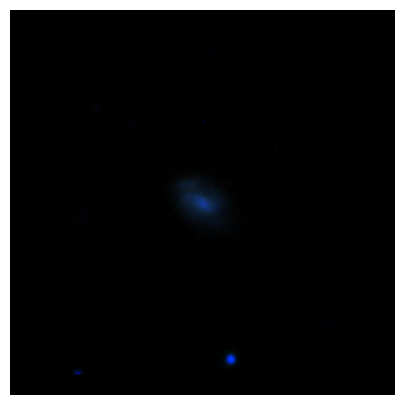

In [60]:
img = s.get_3_chans(idx[4]).copy()
print(img.shape)
new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = np.pad(img[:, :, i], (12, 12), 'constant', constant_values=0)
img = np.array(new_img) / 255. 
img = img - imagenet_mean
img_4 = img / imagenet_std
img_list.append(img_4)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_4))

(200, 200, 3)


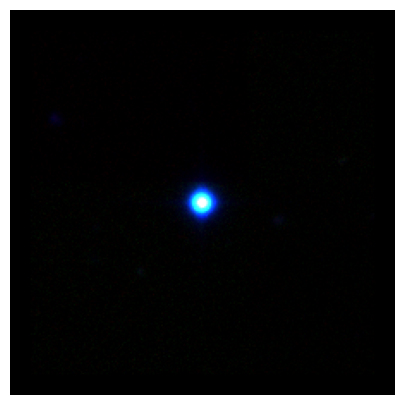

In [61]:
img = s.get_3_chans(2).copy()
print(img.shape)
new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = np.pad(img[:, :, i], (12, 12), 'constant', constant_values=0)
img = np.array(new_img) / 255. 
img = img - imagenet_mean
img_5 = img / imagenet_std
img_list.append(img_5)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_5))

### Load a pre-trained MAE model

In [13]:
# This is an MAE model trained with pixels as targets for visualization (ViT-Large, training mask ratio=0.75)

# download checkpoint if not exist
!wget -nc https://dl.fbaipublicfiles.com/mae/visualize/mae_visualize_vit_large.pth

chkpt_dir = 'mae_visualize_vit_large.pth'
model_mae = prepare_model(chkpt_dir, 'mae_vit_large_patch16')
print('Model loaded.')


File ‘mae_visualize_vit_large.pth’ already there; not retrieving.

<All keys matched successfully>
Model loaded.


### Run MAE on the image

MAE with pixel reconstruction (75% masked):
False
tensor(False) tensor(False)


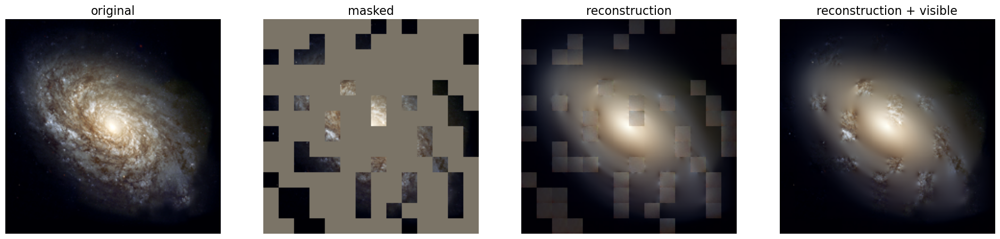

In [23]:
# make random mask reproducible (comment out to make it change)
torch.manual_seed(2)
print('MAE with pixel reconstruction (75% masked):')
run_one_image(img_gal, model_mae)

MAE with pixel reconstruction (75% masked):
False
tensor(False) tensor(False)


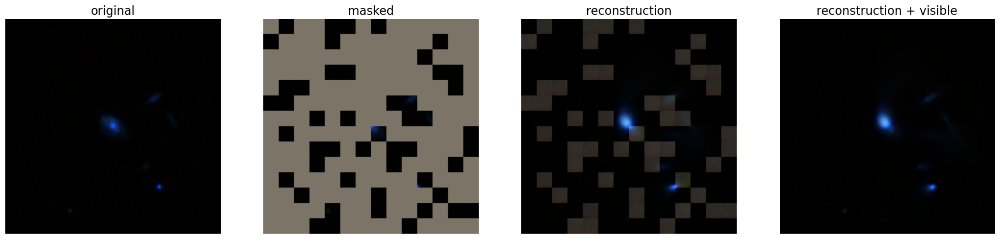

False
tensor(False) tensor(False)


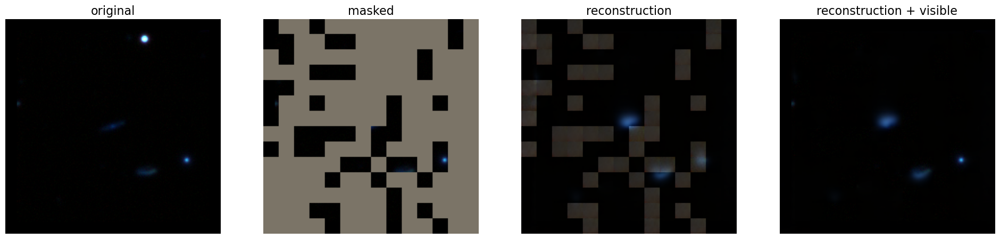

False
tensor(False) tensor(False)


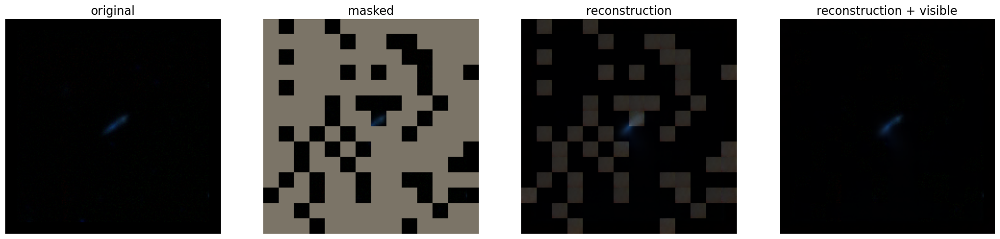

False
tensor(False) tensor(False)


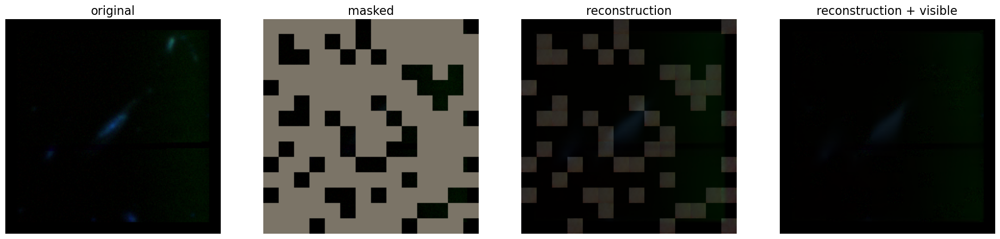

False
tensor(False) tensor(False)


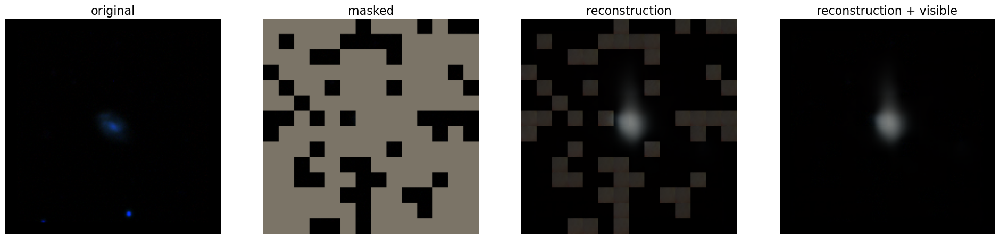

False
tensor(False) tensor(False)


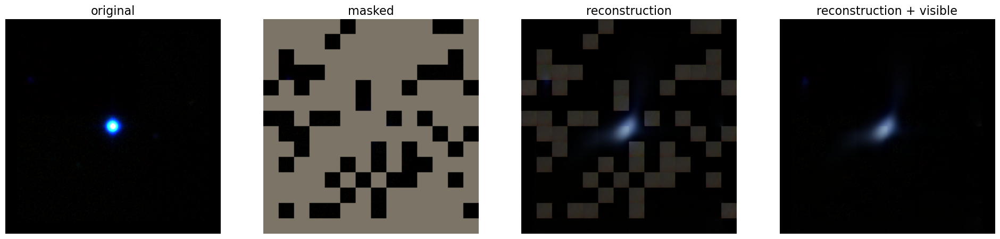

In [24]:
print('MAE with pixel reconstruction (75% masked):')
for img in img_list:
    run_one_image(img, model_mae)

The last two images are a good reminder that we want to have a smaller cutout size, less masking, or some inforcement that there is no masking right at the center so that the model has an honest shot at doing the reconstruction. Lets try less masking:

MAE with pixel reconstruction (25% masked):
False
tensor(False) tensor(False)


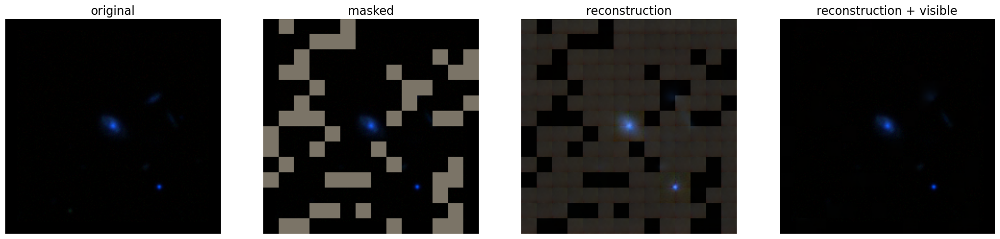

False
tensor(False) tensor(False)


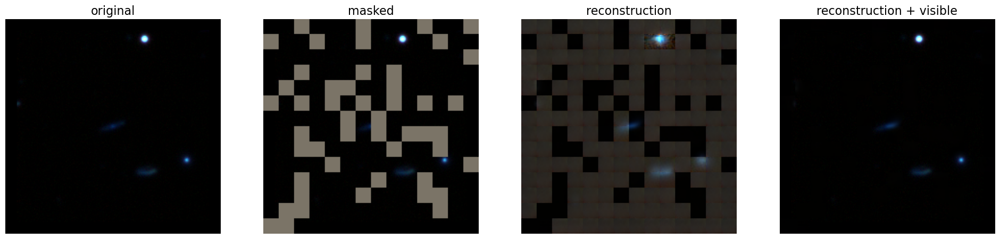

False
tensor(False) tensor(False)


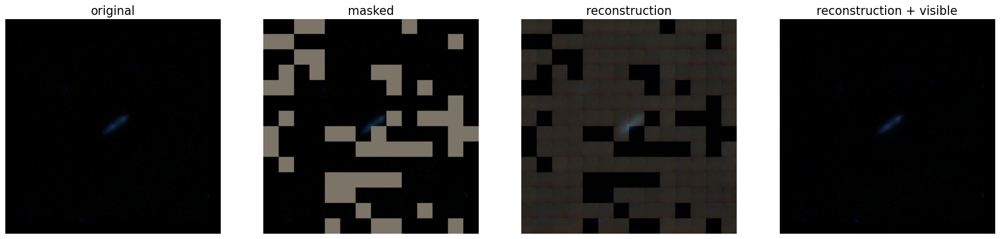

False
tensor(False) tensor(False)


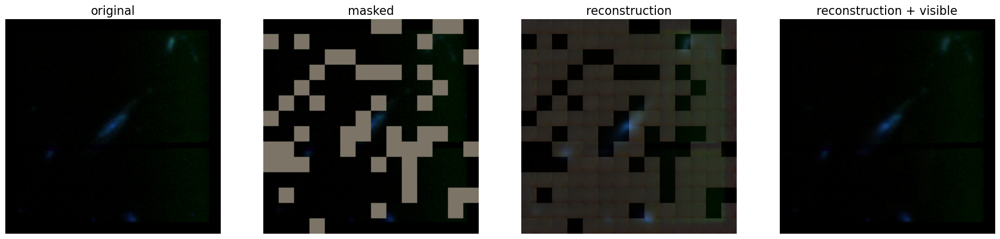

False
tensor(False) tensor(False)


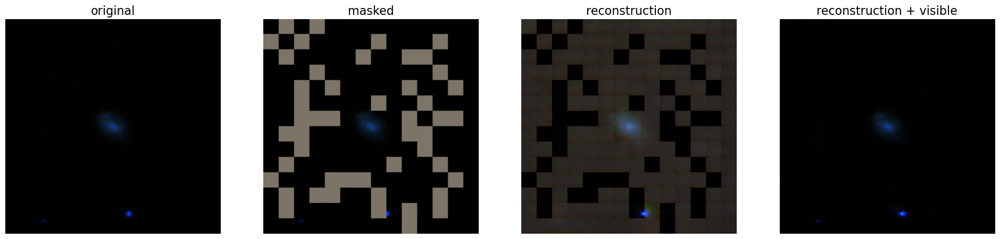

False
tensor(False) tensor(False)


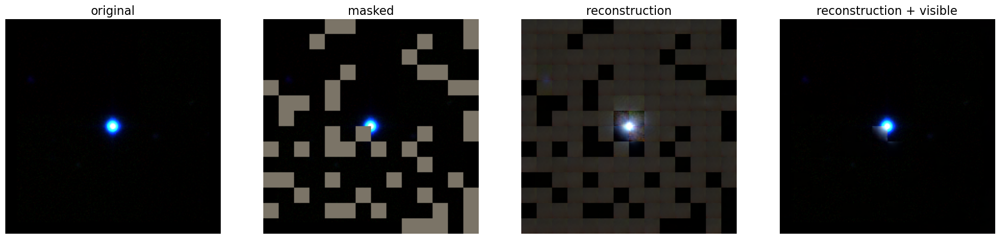

In [26]:
print('MAE with pixel reconstruction (25% masked):')
for img in img_list:
    run_one_image(img, model_mae, mask_ratio=0.25)

MAE with pixel reconstruction (50% masked):
False
tensor(False) tensor(False)


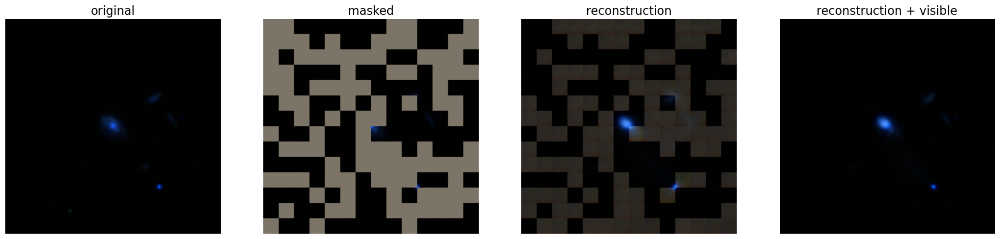

False
tensor(False) tensor(False)


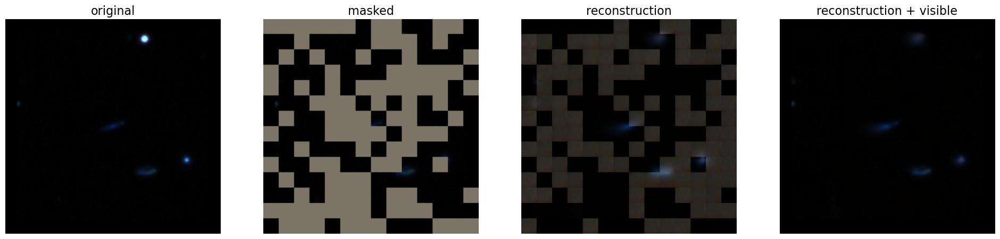

False
tensor(False) tensor(False)


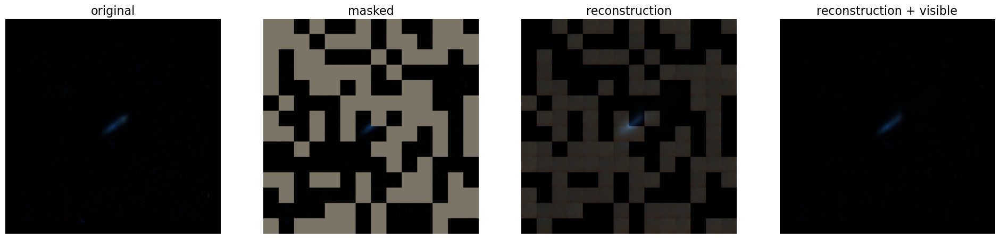

False
tensor(False) tensor(False)


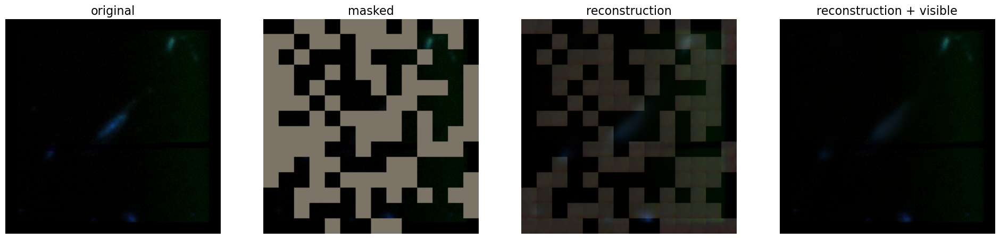

False
tensor(False) tensor(False)


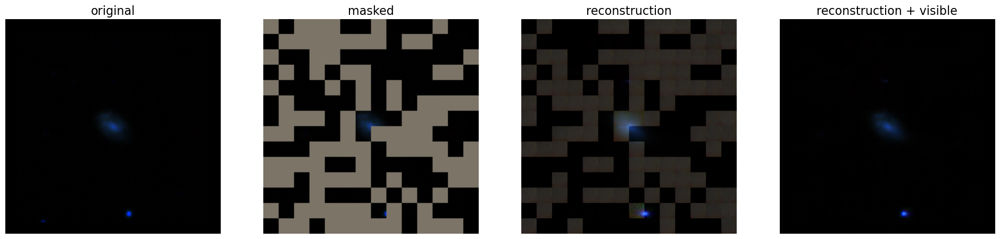

False
tensor(False) tensor(False)


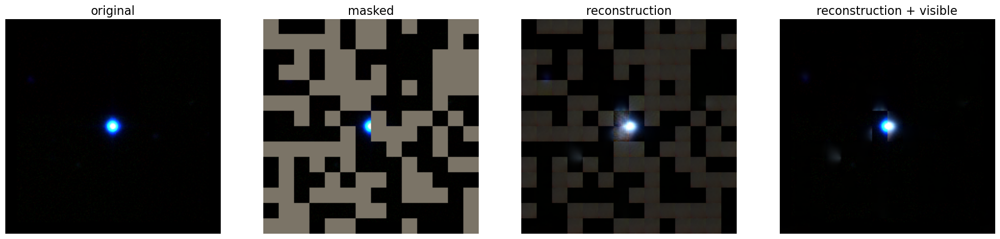

In [27]:
print('MAE with pixel reconstruction (50% masked):')
for img in img_list:
    run_one_image(img, model_mae, mask_ratio=0.50)

Lowering the mask ratio solves the issue a bit but we probably want to still lower the cutout size. Since this model was trained on 224x224 I will load in 64x64 images and upsample them to this larger size.

## Zooming In

In [68]:
kwargs = {
        'n_cutouts': 57000,
        'bands': ['u', 'g', 'r', 'i', 'z'],
        'cutout_size': 64,
        'cutouts_per_file': 10000,
        'batch_size': 1,
        'h5_directory': '/arc/projects/unions/ssl/data/processed/unions-cutouts/ugriz_lsb/10k_per_h5'
    }
    
s = dataloaders.SpencerHDF5ReaderDataset(**kwargs)
print(s[0].shape)

idx=[9072, 9079, 1006, 10122, 40446]
print(s.get_3_chans(idx[0]).shape)

(1, 5, 64, 64)
(64, 64, 3)


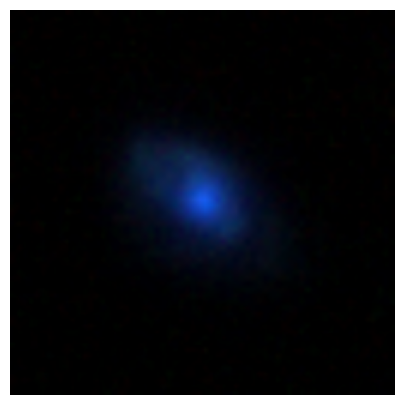

In [76]:
# load an image (make this into a function)
img = s.get_3_chans(idx[0]).copy().astype(np.float32)

new_img = np.zeros((224, 224, 3))
for i in range(3):
    #print(new_img[:, :, i].shape)
    #print(img[:, :, i].shape)
    new_img[:, :, i] = cv2.resize(img[:, :, i], (224, 224))
#img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_CUBIC)

img= np.array(new_img) / 255. # need to norm by something else, take max and min

assert img.shape == (224, 224, 3)

# normalize by ImageNet mean and std (redo for your case)
img = img - imagenet_mean
img_0_zoom = img / imagenet_std

img_list_zoom = []
img_list_zoom.append(img_0_zoom)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_0_zoom))

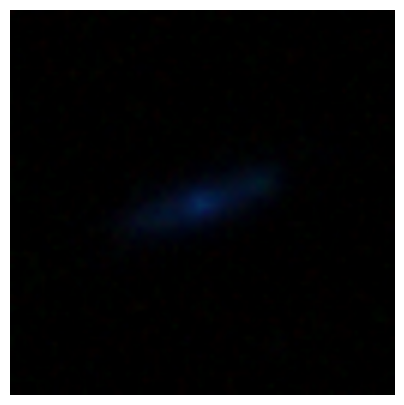

In [80]:
# load an image (make this into a function)
img = s.get_3_chans(idx[1]).copy().astype(np.float32)

new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = cv2.resize(img[:, :, i], (224, 224))

img= np.array(new_img) / 255.
assert img.shape == (224, 224, 3)

img = img - imagenet_mean
img_1_zoom = img / imagenet_std
img_list_zoom.append(img_1_zoom)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_1_zoom))

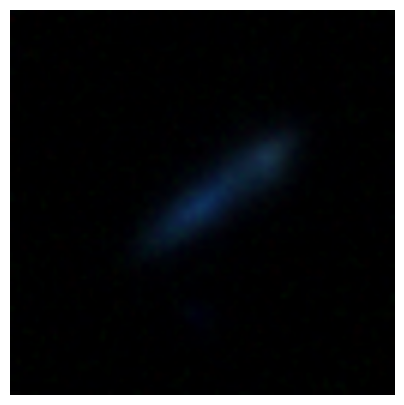

In [81]:
# load an image (make this into a function)
img = s.get_3_chans(idx[2]).copy().astype(np.float32)

new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = cv2.resize(img[:, :, i], (224, 224))

img= np.array(new_img) / 255.
assert img.shape == (224, 224, 3)

img = img - imagenet_mean
img_2_zoom = img / imagenet_std
img_list_zoom.append(img_2_zoom)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_2_zoom))

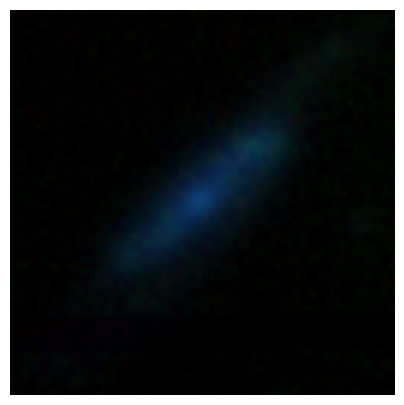

In [82]:
# load an image (make this into a function)
img = s.get_3_chans(idx[3]).copy().astype(np.float32)

new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = cv2.resize(img[:, :, i], (224, 224))

img= np.array(new_img) / 255.
assert img.shape == (224, 224, 3)

img = img - imagenet_mean
img_3_zoom = img / imagenet_std
img_list_zoom.append(img_3_zoom)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_3_zoom))

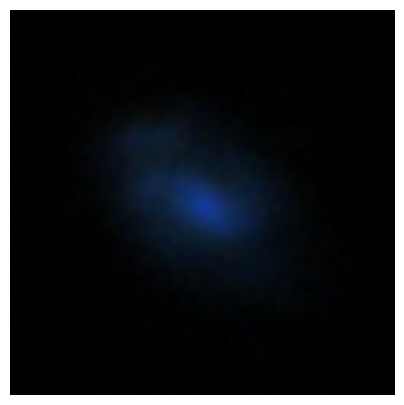

In [83]:
# load an image (make this into a function)
img = s.get_3_chans(idx[4]).copy().astype(np.float32)

new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = cv2.resize(img[:, :, i], (224, 224))

img= np.array(new_img) / 255.
assert img.shape == (224, 224, 3)

img = img - imagenet_mean
img_4_zoom = img / imagenet_std
img_list_zoom.append(img_4_zoom)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_4_zoom))

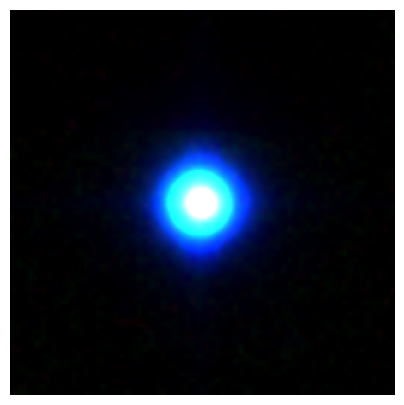

In [84]:
# load an image (make this into a function)
img = s.get_3_chans(2).copy().astype(np.float32)

new_img = np.zeros((224, 224, 3))
for i in range(3):
    new_img[:, :, i] = cv2.resize(img[:, :, i], (224, 224))

img= np.array(new_img) / 255.
assert img.shape == (224, 224, 3)

img = img - imagenet_mean
img_5_zoom = img / imagenet_std
img_list_zoom.append(img_5_zoom)

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img_5_zoom))

MAE with pixel reconstruction (75% masked):
False
tensor(False) tensor(False)


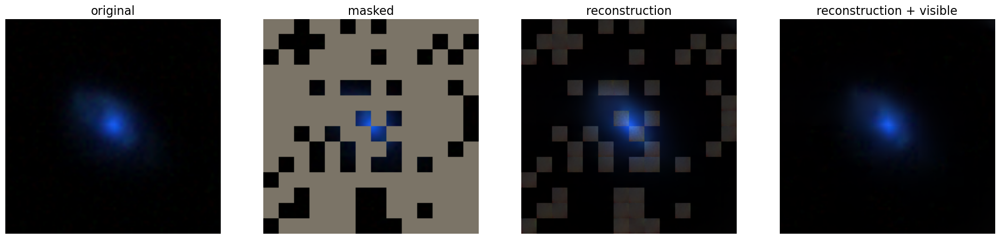

False
tensor(False) tensor(False)


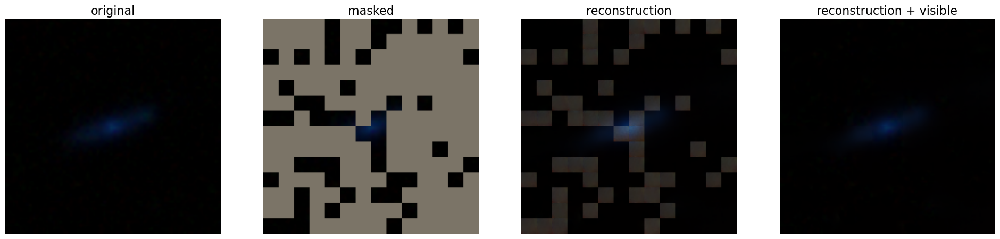

False
tensor(False) tensor(False)


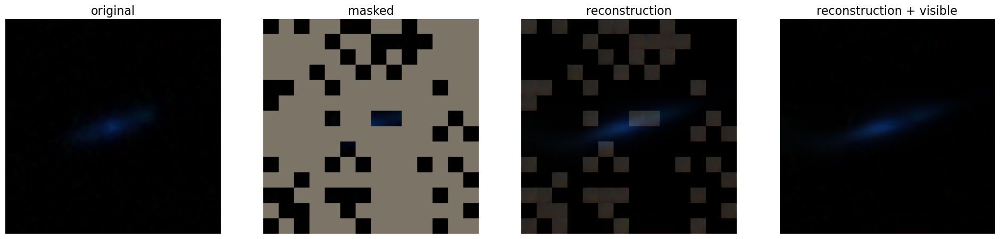

False
tensor(False) tensor(False)


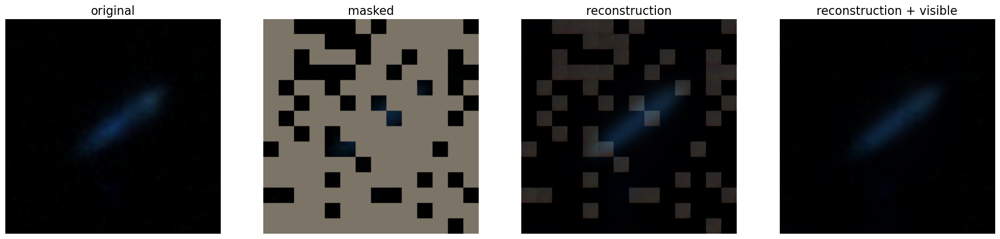

False
tensor(False) tensor(False)


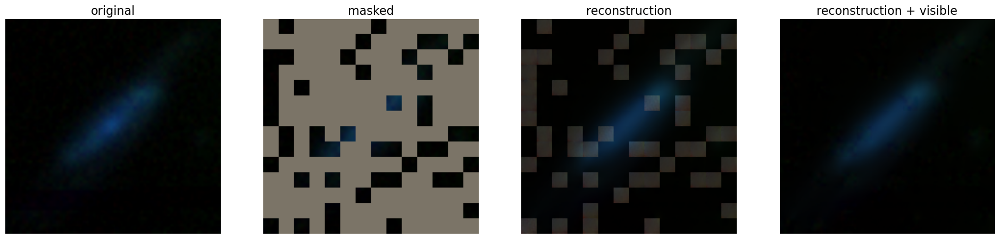

False
tensor(False) tensor(False)


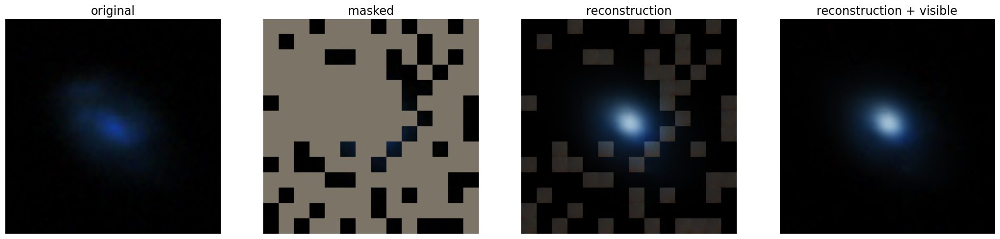

False
tensor(False) tensor(False)


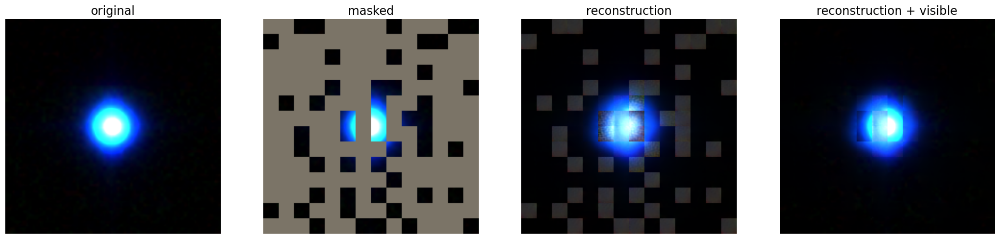

In [85]:
print('MAE with pixel reconstruction (75% masked):')
for img in img_list_zoom:
    run_one_image(img, model_mae)

Not using all this stuff below...

In [73]:
img = s.get_3_chans(idx[0]).copy().astype(np.float32)[:,:,0]#np.zeros((64, 64))
print(img.shape) # is it a type issue?
new_img = cv2.resize(img, (224, 224))
print(new_img.shape)

(64, 64)
(224, 224)


In [53]:
#img_0 = cv2.resize(img_0, (64, 64), interpolation=cv2.INTER_CUBIC)
#print(img_0.shape) 

(64, 64, 3)


In [45]:
import cv2

def paddedzoom(img, zoomfactor=0.8):
    
    '''
    Zoom in/out an image while keeping the input image shape.
    i.e., zero pad when factor<1, clip out when factor>1.
    there is another version below (paddedzoom2)
    '''

    out  = np.zeros_like(img)
    zoomed = cv2.resize(img, None, fx=zoomfactor, fy=zoomfactor)
    
    h, w = img.shape
    zh, zw = zoomed.shape
    
    if zoomfactor<1:    # zero padded
        out[(h-zh)/2:-(h-zh)/2, (w-zw)/2:-(w-zw)/2] = zoomed
    else:               # clip out
        out = zoomed[(zh-h)/2:-(zh-h)/2, (zw-w)/2:-(zw-w)/2]

    return out
    
    
def paddedzoom2(img, zoomfactor=0.8):
    
    ' does the same thing as paddedzoom '
    
    h,w = img.shape
    M = cv2.getRotationMatrix2D( (w/2,h/2), 0, zoomfactor) 
    
    return cv2.warpAffine(img, M, img.shape[::-1])

In [46]:
image_0_zoom = paddedzoom(img_0, zoomfactor=2)

ValueError: too many values to unpack (expected 2)

In [42]:
import scipy.ndimage
img_0_zoom = scipy.ndimage.zoom(img_0, 2, order=0)
print(img_0_zoom.shape)

(448, 448, 6)


In [41]:
show_image(torch.tensor(img_0_zoom))

AssertionError: 

### Load another pre-trained MAE model

In [28]:
# This is an MAE model trained with an extra GAN loss for more realistic generation (ViT-Large, training mask ratio=0.75)

# download checkpoint if not exist
!wget -nc https://dl.fbaipublicfiles.com/mae/visualize/mae_visualize_vit_large_ganloss.pth

chkpt_dir = 'mae_visualize_vit_large_ganloss.pth'
model_mae_gan = prepare_model('mae_visualize_vit_large_ganloss.pth', 'mae_vit_large_patch16')
print('Model loaded.') 

File ‘mae_visualize_vit_large_ganloss.pth’ already there; not retrieving.

<All keys matched successfully>
Model loaded.


MAE with extra GAN loss (75% masked):
False
tensor(False) tensor(False)


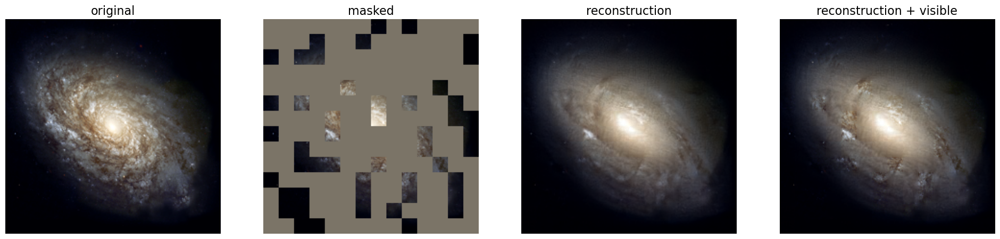

In [36]:
# make random mask reproducible (comment out to make it change)
torch.manual_seed(2)
print('MAE with extra GAN loss (75% masked):')
run_one_image(img_gal, model_mae_gan)

MAE with extra GAN loss (50% masked):
False
tensor(False) tensor(False)


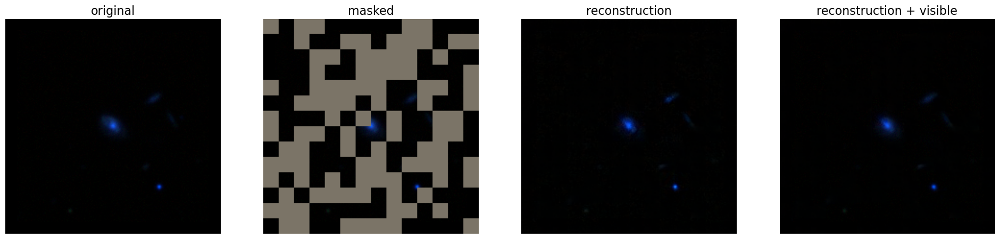

False
tensor(False) tensor(False)


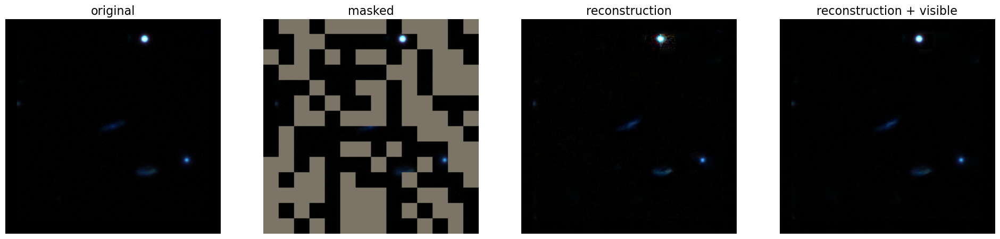

False
tensor(False) tensor(False)


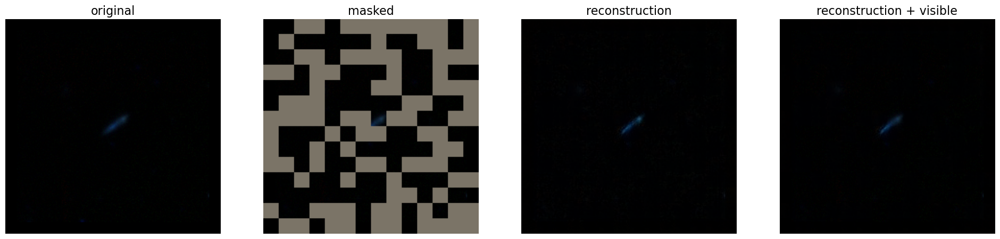

False
tensor(False) tensor(False)


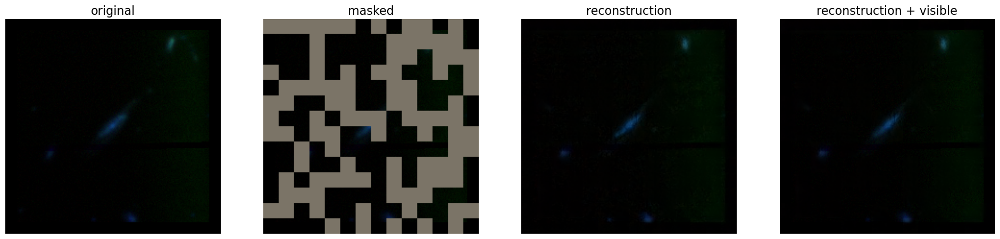

False
tensor(False) tensor(False)


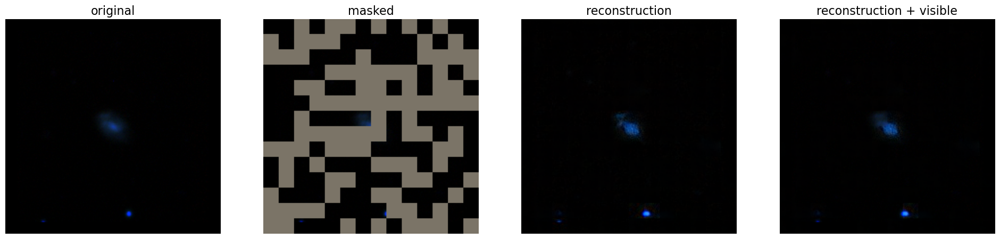

False
tensor(False) tensor(False)


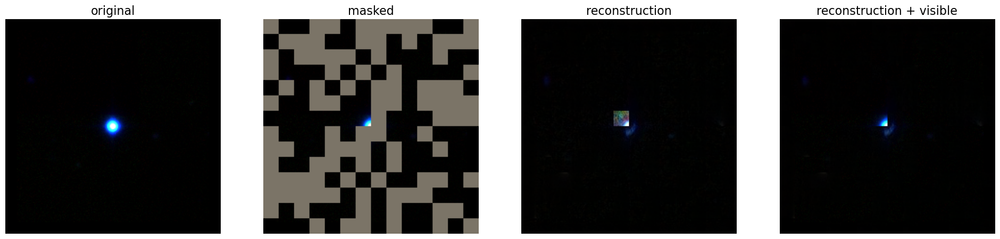

In [37]:
print('MAE with extra GAN loss (50% masked):')
for img in img_list:
    run_one_image(img, model_mae_gan, mask_ratio=0.50)

MAE with extra GAN loss (75% masked):
False
tensor(False) tensor(False)


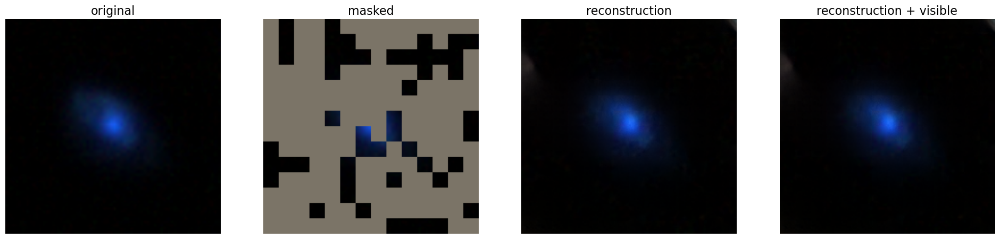

False
tensor(False) tensor(False)


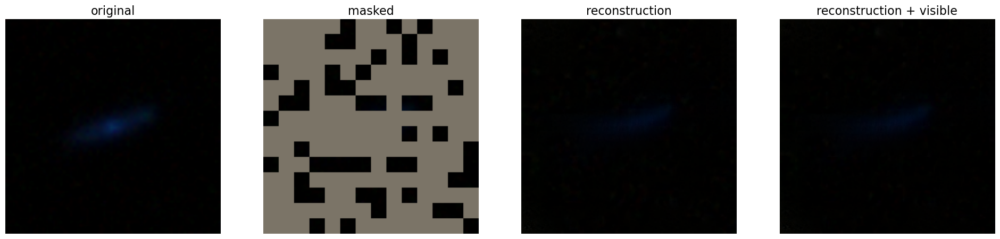

False
tensor(False) tensor(False)


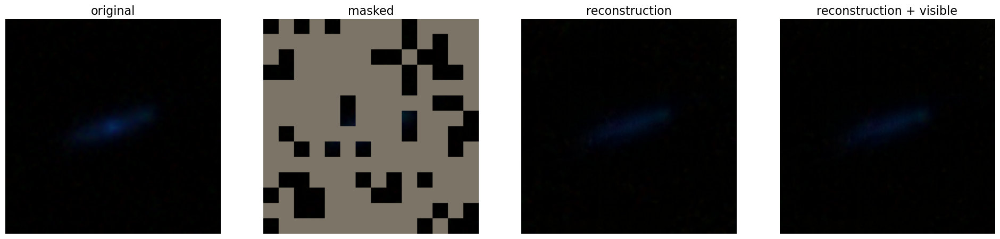

False
tensor(False) tensor(False)


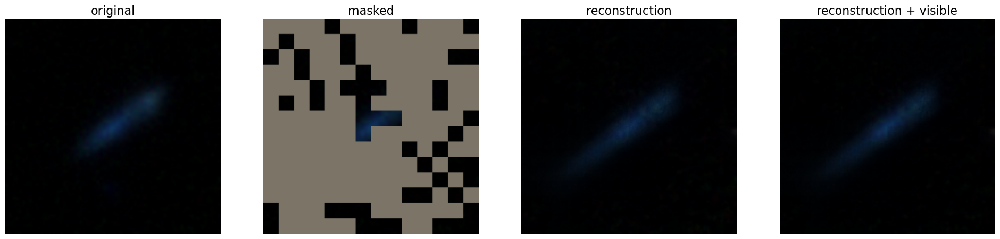

False
tensor(False) tensor(False)


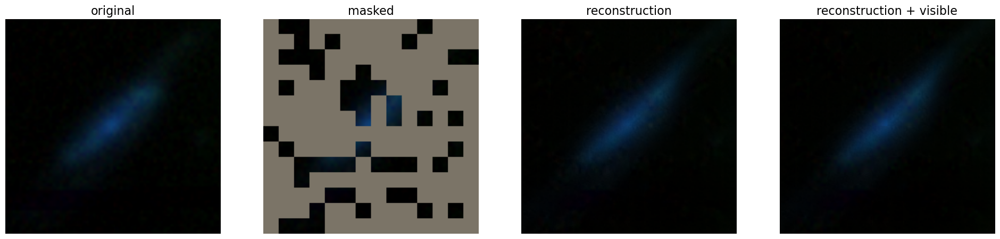

False
tensor(False) tensor(False)


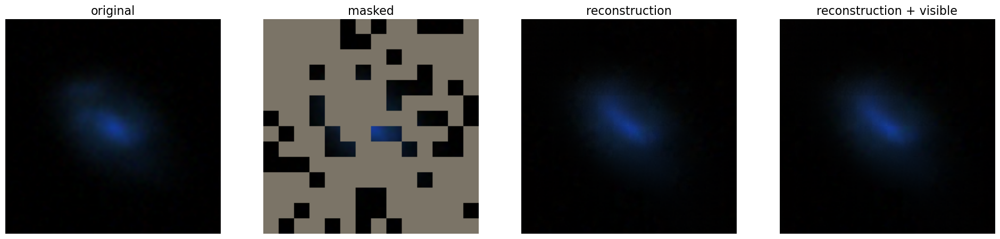

False
tensor(False) tensor(False)


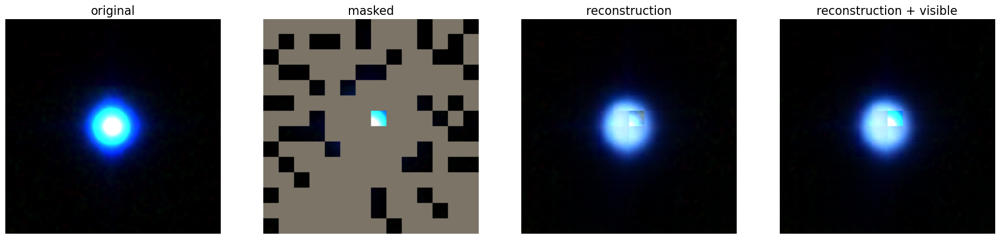

In [86]:
print('MAE with extra GAN loss (75% masked):')
for img in img_list_zoom:
    run_one_image(img, model_mae_gan, mask_ratio=0.75)

## Investigating Representations

In [ ]:
# pass 50k dataset through model to get embeddings

In [ ]:
# umap or t-sne with image previews (can't figure out how to do this)

In [ ]:
# project redshfit

## Training your own model

origional:
python submitit_pretrain.py \
    --job_dir ${JOB_DIR} \
    --nodes 8 \
    --use_volta32 \
    --batch_size 64 \
    --model mae_vit_large_patch16 \
    --norm_pix_loss \
    --mask_ratio 0.75 \
    --epochs 800 \
    --warmup_epochs 40 \
    --blr 1.5e-4 --weight_decay 0.05 \
    --data_path ${IMAGENET_DIR}

mine:
python submitit_pretrain.py \
    --nodes 1 \
    --use_volta32 \
    --batch_size 64 \
    --model mae_vit_large_patch16_chans5 \
    --norm_pix_loss \
    --mask_ratio 0.75 \
    --epochs 100 \
    --warmup_epochs 10 \
    --blr 1.5e-4 --weight_decay 0.05 

I have then also updated:
- wandb logging
- scaling to be min/max 
- data loader to be the one from dark3d
- image size to be 64x64
- validation line
- 5 channels


Yet to do:
- change the regularization 
- random shuffle
- investigate nan losses